The following notebook was contributed to by Patrick Noerr and Joshua Tamayo for our PHYS 230 Final Project.

The notebook seeks to solve the following set of equations:

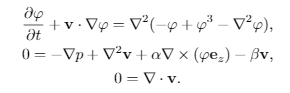

The above equations can be recast in Fourier Space in the following way:

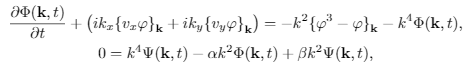

Both representations of the governing equations are attempted in the following notebook. The notebook successfully solves the Cahn-Hilliard Equation in the non-convective limit for both the spinodal decomposition regime and the nucleation regime in real space. **All functions utilizing the spectral method are at this point non-functional.** 

In [1]:
#Import relevant libraries and modules
%matplotlib inline 
import numpy as np
import cmath
import matplotlib.pyplot as plt
import random
import os
from scipy.fft import fft2, ifft2, fftfreq, rfft2, irfft2, fft
from scipy.fftpack import fftshift
from scipy.signal import convolve2d

In [34]:
#Determines grid spacing from number of grid points and initializes composition field "u" as a grid of
#concentrations drawn from a uniform distribution between lower bound(lb) and upper bound(ub)
def get_initial_configuration(N,lb,ub):
    dx = 20/(N-1)
    dy = 20/(N-1)
    u = [[random.uniform(lb,ub) for i in range(N)] for j in range(N)]
    #u=[[random.uniform(-.1,.1) for i in range(N)] for j in range(N)] #Gives us spinodal decomposition of composition field
    #u=[[random.uniform(-.1,.9) for i in range(N)] for j in range(N)] #Gives us nucleation of composition field
    return u

In [35]:
#Define the 2d Laplacian
def discrete_laplacian(M):
    """Get the discrete Laplacian of matrix M"""
    L = -4*M
    L += np.roll(M, (0,-1), (0,1)) # right neighbor
    L += np.roll(M, (0,+1), (0,1)) # left neighbor
    L += np.roll(M, (-1,0), (0,1)) # top neighbor
    L += np.roll(M, (+1,0), (0,1)) # bottom neighbor
    return L

In [36]:
#Computes the velocity field using the spectral method
def velocity(u,a,b,dx,dy,N):
    u = np.asarray(u)
    clone = u.copy()
    #psi = np.ones((N,N))
    velx = np.ones((N,N))
    vely = np.ones((N,N))
    uprime = fft2(u)
    n_value = fftfreq(N,(1.0/N))
    kx_array = np.zeros((N,N),dtype = float)
    ky_array = np.zeros((N,N),dtype = float)
    x_length = 20
    y_length = 20    
    for i in range(0,N):
        for j in range(0,N):
            kx_array[i][j]=(2*np.pi*n_value[j])/x_length
            ky_array[i][j]=(2*np.pi*n_value[i])/y_length
            velx[i][j] = uprime[i][j]*complex(1)*ky_array[i][j]*(a/((kx_array[i][j]**2.+ky_array[i][j]**2.)+b))
            vely[i][j] = uprime[i][j]*(-complex(1))*kx_array[i][j]*(a/((kx_array[i][j]**2.+ky_array[i][j]**2.)+b))   
            #psi[i][j]= (a/((kx_array[i][j]**2.+ky_array[i][j]**2.)+b))*uprime[i][j] #In case we want the stream function explicitly
    velx, vely = abs(ifft2(velx)), abs(ifft2(vely))
    return velx, vely

In [37]:
#Computes the velocity field in real space
def psi(u,a,b,N):
    grad4 = np.zeros((N,N))
    bgrad2 = np.zeros((N,N))
    for i in range(N):
        for j in range(N):
            if (i==j):
                grad4[i][j]=6
                bgrad2[i][j]=-2*b
            if (i==j+1):
                grad4[i][j]=-4
                bgrad2[i][j]=1
            if (j==i+1):
                grad4[i][j]=-4
                bgrad2[i][j]=1
            if (i==j+2):
                grad4[i][j]=1
            if (j==i+2):
                grad4[i][j]=1
    psi = np.multiply(np.linalg.inv(grad4-bgrad2),-a*discrete_laplacian(np.asarray(u)))
    velx = np.gradient(psi)[0]
    vely = -np.gradient(psi)[1]
    return velx,vely

In [38]:
#Imposes a vortical flow
def swirl_flow(N,F):
    velx=np.zeros((N,N))
    vely=np.zeros((N,N))
    for i in range(N):
        for j in range(N):
            if ((i<N/2)and(j<N/2)):
                velx[i][j]=F
                vely[i][j]=-F
            if ((i>N/2)and(j<N/2)):
                velx[i][j]=-F
                vely[i][j]=-F 
            if ((i<N/2)and(j>N/2)):
                velx[i][j]=F
                vely[i][j]=F
            if ((i>N/2)and(j>N/2)):
                velx[i][j]=-F
                vely[i][j]=F
    return velx,vely

In [39]:
#Computes the update of the composition field
def phi_update(u,a,b,VX,VY,t):
    u = np.asarray(u)
    clone = u.copy()
    clone = np.asarray(clone)
    
    m = np.multiply(clone,clone)#\__Compute the elementwise cube of the composition field
    l = np.multiply(clone,m)    #/
    
#The below computes the new composition field in real space:
    #with convection
    u = clone + (-(np.multiply(VX,(np.gradient(clone))[1])+
                   np.multiply(VY,(np.gradient(clone))[0]))+
                 discrete_laplacian(-clone + l - discrete_laplacian(clone)))*t
    return u
    
    #without convection
    #u = clone + discrete_laplacian(-clone + l - discrete_laplacian(clone))*t
    #return u

#The below uses the fourier spectral method to update the composition field
    #with convection
    #    velx = np.ones((N,N),dtype=complex)
    #    vely = np.ones((N,N),dtype=complex)
    #    uprime = fft2(u)
    #    firstterm = fft2(l-clone)
    #    n_value = fftfreq(N,(1.0/N))
    #    kx_array = np.zeros((N,N),dtype = float)
    #    ky_array = np.zeros((N,N),dtype = float)
    #    x_length = 20
    #    y_length = 20
    #    for i in range(0,N):
    #        for j in range(0,N):
    #            kx_array[i][j]=(2*np.pi*n_value[j])/x_length
    #            ky_array[i][j]=(2*np.pi*n_value[i])/y_length
    #            velx[i][j] = uprime[i][j]*complex(1)*ky_array[i][j]*(a/((kx_array[i][j]**2.+ky_array[i][j]**2.)+b))
    #            vely[i][j] = uprime[i][j]*(-complex(1))*kx_array[i][j]*(a/((kx_array[i][j]**2.+ky_array[i][j]**2.)+b))
    #    velx = ifft2(velx)
    #    vely = ifft2(vely)
    #    secondterm = fft2(np.multiply(velx,clone))
    #    thirdterm = fft2(np.multiply(vely,clone))
    #    for i in range(0,N):
    #        for j in range(0,N):
    #            u[i][j] = (uprime[i][j]-t*(kx_array[i][j]**2.+ky_array[i][j]**2.)*firstterm[i][j]-t*(complex(1)*kx_array[i][j]*secondterm[i][j]+complex(1)*ky_array[i][j]*thirdterm[i][j]))/(1+t*((kx_array[i][j]**2.+ky_array[i][j]**2.)**2.))            
    #    return abs(ifft2(u))
    
    #without convection
    #uprime = fft2(u)
    #firstterm = fft2(l-clone)
    #n_value = fftfreq(N,(1.0/N))
    #kx_array = np.zeros((N,N),dtype = float)
    #ky_array = np.zeros((N,N),dtype = float)
    #x_length = 20
    #y_length = 20
    #for i in range(0,N):
    #    for j in range(0,N):
    #        kx_array[i][j]=(2*np.pi*n_value[j])/x_length
    #        ky_array[i][j]=(2*np.pi*n_value[i])/y_length
    #        u[i][j] = (uprime[i][j]-t*(kx_array[i][j]**2.+ky_array[i][j]**2.)*firstterm[i][j])/(1+t*((kx_array[i][j]**2.+ky_array[i][j]**2.)**2.))  
    #return abs(ifft2(u))

In [56]:
#This is the main function which updates the system quantities in time
def forward_solver_full(a,b,num_steps,N,interval,lb,ub):
    dx = 20 / (N-1)
    dy = 20 / (N-1)
    x = np.linspace(-10., 10., N)
    y = np.linspace(-10., 10., N)
    Y, X = np.meshgrid(y, x)
    u = get_initial_configuration(N,lb,ub)
    fig = plt.figure()
    axes = fig.add_subplot(1, 1, 1, aspect='equal')
    plot = plt.imshow(u, extent=(-10, 10, -10, 10), interpolation='nearest')
    fig.colorbar(plot)
    t = 0.0
    dt = dx**4. #This time step ensures stability given governing equations involve fourth order gradients. For passive coarsening case, has been run using time steps as large as 10^-2 with good results.
    next_output_time = 0.0
    os.mkdir('a'+'_'+str(a)+'_'+'b'+'_'+str(b)+'N'+'_'+str(N)+'_'+'int'+'_'+str(interval)+'_'+'lb'+'_'+str(lb)+'_'+'ub'+'_'+str(ub)) #Generate a directory in which to store frames in the current working directory
    for j in range(num_steps):  
        #velx, vely = psi(u,a,b,N) #Solves velocity in real space               
        #velx, vely = velocity(u, a, b, dx, dy, N) #Solves velocity using spectral method    
        velx,vely = swirl_flow(N,.8)                                                    
        u = phi_update(u,a,b,velx,vely,dt)
        t += dt                                                                        
        if t >= next_output_time:                                                                                                            
            next_output_time += interval                                               
            fig1 = plt.figure()                                                        
            axes1 = fig1.add_subplot(1, 1, 1, aspect='equal')                          
            plot1 = plt.imshow(u, extent=(-10, 10, -10, 10), interpolation='bilinear') 
            fig1.colorbar(plot1)                                                       
            #Uncomment the following three lines to populate directory generated above by os.mkdir
            name = (str(a)+'_'+str(b)+'_'+ str(t) + '.png')  #Uncomment the following three lines to populate directory generated above by os.mkdir                            
            my_path = os.path.abspath('a'+'_'+str(a)+'_'+'b'+'_'+str(b)+'N'+'_'+str(N)+'_'+'int'+'_'+str(interval)+'_'+'lb'+'_'+str(lb)+'_'+'ub'+'_'+str(ub))              
            plt.savefig(os.path.join(my_path,name))                                  
            plt.show()

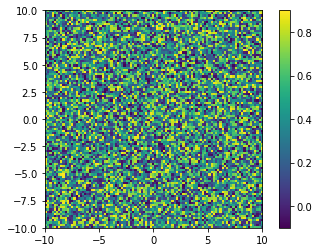

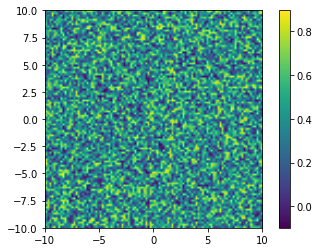

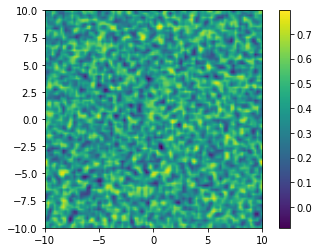

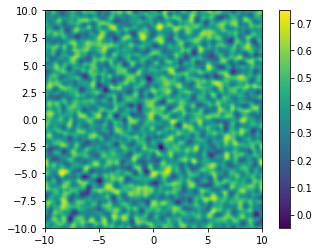

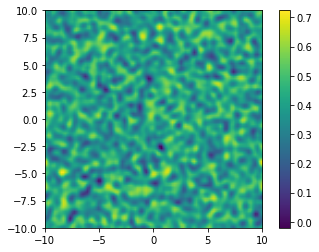

...

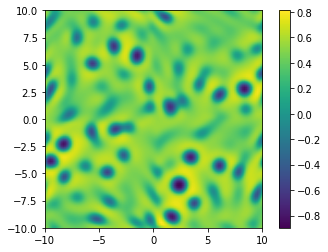

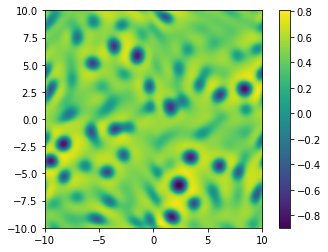

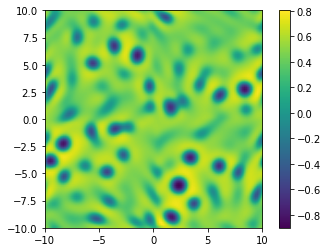

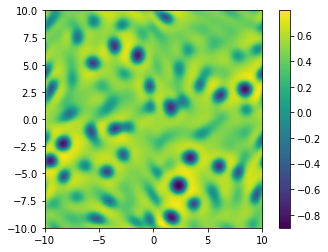

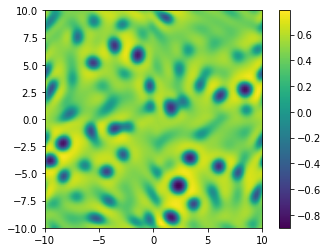

In [ ]:
#Runs the forward solver function showing the composition field snapshots in time
#forward_solver_full(10,101,10000,100,.1,-.1,.1) #Spinodal Decomposition
forward_solver_full(10,103,20000,100,.1,-.1,.9) #Nucleation

In [13]:
#Checking the flow field we get from a point force at the origin (Stokeslet) - Computes green's function components
N = 100
S_xx = np.zeros((N,N),dtype = complex)
S_xy = np.zeros((N,N),dtype = complex)
S_yx = np.zeros((N,N),dtype = complex)
S_yy = np.zeros((N,N),dtype = complex)
b_x = np.ones((N,N),dtype = complex)
b_y = np.zeros((N,N),dtype = complex)
for i in range(0,N):
        for j in range(0,N):
            if (((-N*dx/2.+i*dx)**2+(-N*dx/2.+j*dx)**2.)!=0):
                S_xx[i][j] = -np.log(np.sqrt((-N*dx/2.+i*dx)**2+(-N*dx/2.+j*dx)**2.)/(N*dx/np.sqrt(2)))+(-N*dx/2.+i*dx)**2/((-N*dx/2.+i*dx)**2+(-N*dx/2.+j*dx)**2.)
                S_xy[i][j] = (-N*dx/2.+i*dx)*(-N*dx/2.+j*dx)/((-N*dx/2.+i*dx)**2+(-N*dx/2.+j*dx)**2.)
                S_yx[i][j] = (-N*dx/2.+i*dx)*(-N*dx/2.+j*dx)/((-N*dx/2.+i*dx)**2+(-N*dx/2.+j*dx)**2.)
                S_yy[i][j] = -np.log(np.sqrt((-N*dx/2.+i*dx)**2+(-N*dx/2.+j*dx)**2.)/(N*dx/np.sqrt(2)))+(-N*dx/2.+j*dx)**2/((-N*dx/2.+i*dx)**2+(-N*dx/2.+j*dx)**2.)
                

In [14]:
#Trying it in fourier space - multiplication in real space becomes convolution in fourier space
#The convolve2d function takes an undetermined amount of time to run
def u(S_xx,S_xy,S_yx,S_yy,b_x,b_y,N,dx):
    S_xx_f = fft2(S_xx)
    S_xy_f = fft2(S_xy)
    S_yx_f = fft2(S_yx)
    S_yy_f = fft2(S_yy)
    b_x_f = fft2(b_x)
    b_y_f = fft2(b_y)
    u_x_f = np.zeros((N,N))
    u_y_f = np.zeros((N,N))
    for i in range(0,N):
        for j in range(0,N):
            if (((-N*dx/2.+i*dx)**2+(-N*dx/2.+j*dx)**2.)!=0):
                u_x_f = convolve2d(S_xx_f,b_x_f,boundary='wrap')+convolve2d(S_xy_f,b_y_f,boundary='wrap')
                u_y_f = convolve2d(S_yx_f,b_x_f,boundary='wrap')+convolve2d(S_yy_f,b_y_f,boundary='wrap')
    return abs(ifft2(u_x_f)), abs(ifft2(u_y_f))

In [74]:
#Real space check
def u_real(N,dx):
    u_x = np.zeros((N,N))
    u_y = np.zeros((N,N))
    for i in range(0,N):
        for j in range(0,N):
            if (((-N*dx/2.+i*dx)**2+(-N*dx/2.+j*dx)**2.)!=0):
                u_x[i][j] = -np.log(np.sqrt((-N*dx/2.+i*dx)**2+(-N*dx/2.+j*dx)**2.)/(N*dx/np.sqrt(2)))+(-N*dx/2.+i*dx)**2/((-N*dx/2.+i*dx)**2+(-N*dx/2.+j*dx)**2.)
                u_y[i][j] = (-N*dx/2.+i*dx)*(-N*dx/2.+j*dx)/((-N*dx/2.+i*dx)**2+(-N*dx/2.+j*dx)**2.)
    return u_x,u_y

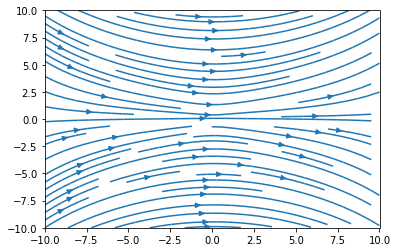

In [77]:
#Plot the stokeslet flow
N = 100
dx = 20 / N
dy = 20 / N
x = np.linspace(-10, 10, N)
y = np.linspace(-10, 10, N)
Y, X = np.meshgrid(y, x)
u_x,u_y = u_real(N,dx)
#u_x,u_y = u(S_xx,S_xy,S_yx,S_yy,b_x,b_y,N,dx)
plt.streamplot(x,y,u_x,u_y)
plt.show()